In [1]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
import seaborn as sns
import copy
# from sklearn.preprocessing import StandardScaler

In [2]:
ad = pd.read_csv('//media//sajjad//New Volume//Dataset//datadays2020_contest_public_dataset//ad.csv')

In [3]:
ad_image = pd.read_pickle('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/ad_image2.pkl')

In [4]:
ad_title = pd.read_csv('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/ad_title.csv')

In [5]:
click_test = pd.read_csv('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/click_test.csv')

In [6]:
click_train = pd.read_csv('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/click_train.csv')

In [7]:
event = pd.read_csv('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/event.csv')
event.drop('userId',axis=1,inplace=True)

In [8]:
page = pd.read_csv('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/page.csv')

In [9]:
page_topic = pd.read_csv('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/page_topic.csv')

In [10]:
# mindisplayId = event['displayId'].unique()[:5000]
# optimizer_list = []
# i = 0
# for id_ in mindisplayId :
#     z = pd.merge(event[event['displayId']==id_],click_train[(click_train['displayId']==id_)])
  
#     size = len(z)
#     for j in range(size):
#         optimizer_list.append(z.iloc[j].values)
       
# new_df = pd.DataFrame(optimizer_list,columns=['displayId','timestamp','pageId','widgetId','device','OS','browser','adId','clicked',])
# new_df.to_pickle('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/new_df.pkl')



new_df = pd.read_pickle('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/new_df.pkl')
new_df.head()

,displayId,timestamp,pageId,widgetId,device,OS,browser,adId,clicked
0,4706262,1578429005696,3543873,6262,0,0,0,6,1
1,4706262,1578429005696,3543873,6262,0,0,0,15,0
2,4706262,1578429005696,3543873,6262,0,0,0,3610,0
3,4706267,1578429007726,6245475,607,1,3,0,5279,0
4,4706267,1578429007726,6245475,607,1,3,0,5271,0


In [11]:
# FIXING STRING IMAGES

# imageFeatures = ad_image['imageFeatures']
# i = 0 
# new_column = []
# for i in range(3256) :
#     s = str(imageFeatures[i]).replace('[','')
#     s = s.replace(']','')
#     l = s.split(',')
#     l = [np.float64(x) for x in l]
#     new_column.append(l)
# ad_image = pd.DataFrame.from_dict({'adId':ad_image['adId'],'imageFeatures':new_column})
# ad_image.to_pickle('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/ad_image2.pkl')




ad_image = pd.read_pickle('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/ad_image2.pkl')


In [11]:
# # # CREATING CTR_AD ==> calcualte ctr for each train ad

# thin_event = event[['displayId']]
# ctr_ad = thin_event.merge(click_train)
# ids = ctr_ad['adId'].unique()
# ctrs = []
# for id_ in ids :
#     tmp = ctr_ad[ctr_ad['adId']==id_]
#     all_accurance = len(tmp)
#     clicked = len(tmp[tmp['clicked']==1])
#     ctrs.append(clicked/all_accurance)
# maped_value = []

# for ctr in ctrs :
#     if ctr < 0.107085 :
#         maped_value.append(4) 
#     elif ctr < 0.157895 :
#         maped_value.append(3)
#     elif ctr < 0.224571 :
#         maped_value.append(2)
#     else :
#         maped_value.append(1)

# # ctr_ids = ctr_ad['adId'].unique()
# all_ids = ad['adId'].unique()
# subtracted_ids = [id_ for id_ in all_ids if id_ not in ids]
# size = len(subtracted_ids)
# ctrs = ctrs + [0.157895 for i in range(size)]
# ctr_ad = pd.DataFrame.from_dict({'adId':list(ids)+list(subtracted_ids) ,
#                                   'ctr' : ctrs ,
#                                   'rank' : maped_value + [3 for i in range(size)]})

# ctr_ad.to_pickle('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/ctr_ad.pkl')

ctr_ad = pd.read_pickle('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/ctr_ad.pkl')
ctr_ad
                        

,adId,ctr,rank
0,6,0.306068,1
1,15,0.342427,1
2,3610,0.100239,4
3,5279,0.277350,1
4,5271,0.256753,1
...,...,...,...
3251,7183,0.157895,3
3252,5216,0.157895,3
3253,2762,0.157895,3
3254,2233,0.157895,3


In [19]:
# display_ids = list(click_train['displayId']) + list(click_test['displayId'])
# ad_ids = list(click_train['adId']) + list(click_test['adId'])
# size = len(list(click_test['adId']))
# clickeds = list(click_train['clicked']) + [None for i in range(size)]

# kir = pd.DataFrame.from_dict({
#     'displayId':display_ids ,
#     'adId' : ad_ids ,
#     'clicked' : clickeds
# })
# # kir.to_pickle('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/new_df.pkl')

In [12]:
# MERGING TRAIN AND TEST 
# train_plus_test = click_train.append(click_test,ignore_index=True)
# train_plus_test.to_pickle('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/train_plus_test.pkl')

train_plus_test = pd.read_pickle('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/train_plus_test.pkl')

In [13]:
# calculate all ads in a single display
# very_new_df = event[['displayId']].merge(train_plus_test)
# very_new_df.to_pickle('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/very_new_df.pkl')

very_new_df = pd.read_pickle('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/train_plus_test.pkl')

In [43]:
print(len(very_new_df['adId'].unique()))
print(len(click_test['adId'].unique()))
print(len(click_train['adId'].unique()))

print(len(click_test['adId'].unique()) + len(click_train['adId'].unique()))
kke1 = list(click_test['adId'])
kke2 = list(click_train['adId'])
kke3 = kke1 + kke2 
kke3 = set(kke3)
print(len(kke3))


3256
1350
2616
3966
3256


In [14]:
# calculating commen ids in train and test 
test_ids = click_test['adId'].unique()
train_ids = click_train['adId'].unique()
commen = [x for x in test_ids if x in train_ids]

In [15]:
ctr_ad[['ctr']].describe()

,ctr
count,3256.000000
mean,0.171500
std,0.098892
min,0.000000
25%,0.121164
50%,0.157895
75%,0.203148
max,1.000000


In [16]:
# # click_test
# # start from here
# display_ids = click_test['displayId'] 
# test_ad_ids = click_test['adId'] 
# size = len (test_ad_ids)
# ctrs = [0.121164 for i in range(size)] 
# i = 0 
# for id_ in test_ad_ids :
#     if id_ in commen :
#         ctrs[i] = ctr_ad[ctr_ad['adId']==id_].values[0][1]
#     i+=1 

    
# sub_df = pd.DataFrame.from_dict({
#     'displayId':display_ids ,
#     'adId' : test_ad_ids ,
#     'ctr' : ctrs
# })
# sub_df.to_pickle('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/train_plus_test.pkl')

sub_df = pd.read_pickle('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/train_plus_test.pkl')

In [17]:
sub_df

,displayId,adId,ctr
0,151650,7585,0.121164
1,151650,6257,0.205696
2,151650,6690,0.331361
3,151938,7454,0.121164
4,151938,7370,0.121164
...,...,...,...
1199043,1328957,7039,0.290799
1199044,1328976,7167,0.149480
1199045,1328976,535,0.294924
1199046,1328976,7174,0.192683


In [64]:
# SORTING SUB_DF AND SAVE IT TO REAL_SUB_DF DATASET

import time 
stime = time.time()
display_ids = sub_df['displayId'].unique()
sorted_rows = []
for id_ in display_ids :
    pp = sub_df[sub_df['displayId']==id_].sort_values(['ctr'],ascending=0).values
    for row in pp :
        sorted_rows.append(row)
    

real_sub_df = pd.DataFrame(sorted_rows,columns=['displayId','adId','ctr'])
real_sub_df.displayId = real_sub_df.displayId.astype(np.int64)
real_sub_df.adId = real_sub_df.adId.astype(np.int64)
ftime = time.time()

print(ftime - stime)
real_sub_df


1538.2184138298035


,displayId,adId,ctr
0,151650,6690,0.331361
1,151650,6257,0.205696
2,151650,7585,0.121164
3,151938,6690,0.331361
4,151938,123,0.186490
...,...,...,...
1199043,1328957,6515,0.221737
1199044,1328976,535,0.294924
1199045,1328976,7182,0.290931
1199046,1328976,7174,0.192683


In [70]:
real_sub_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1199048 entries, 0 to 1199047
Data columns (total 3 columns):
displayId    1199048 non-null int64
adId         1199048 non-null int64
ctr          1199048 non-null float64
dtypes: float64(1), int64(2)
memory usage: 27.4 MB


In [23]:
list(ad_image['imageFeatures'])

[[0.0032160670962184668,
  0.1444239318370819,
  0.00014861911768093705,
  0.24603649973869324,
  0.1336435228586197,
  0.0,
  0.91535884141922,
  0.49459701776504517,
  0.0,
  0.24490457773208618,
  0.0,
  0.28586870431900024,
  0.010934730060398579,
  0.19385114312171936,
  0.12390805780887604,
  0.0,
  0.0015756727661937475,
  0.4794295132160187,
  0.09985049068927765,
  0.3970349431037903,
  0.0,
  0.08373872190713882,
  0.36580267548561096,
  0.0,
  0.0,
  0.3687375783920288,
  0.0382404625415802,
  0.5301593542098999,
  0.035847894847393036,
  0.7594838738441467,
  0.0,
  0.38756871223449707,
  0.23112042248249054,
  0.0,
  0.0,
  0.04889683797955513,
  0.07304364442825317,
  0.0,
  0.0037031262181699276,
  0.006699768826365471,
  0.36830374598503113,
  0.3588697910308838,
  0.10966762155294418,
  0.42036280035972595,
  0.0,
  0.2676916718482971,
  0.0,
  0.8804364204406738,
  0.2831772267818451,
  0.00630016578361392,
  0.012653515674173832,
  0.408643901348114,
  0.047331862151

In [28]:
# WORKING ON IMAGE FEATURS
type(ad_image['imageFeatures'][1][0])
image_column = list(ad_image['imageFeatures'])
avg_image = image_column[0]
from sklearn.decomposition import KernelPCA
transformer = KernelPCA(n_components=2,kernel='poly',degree=3)
transformed_image_features = transformer.fit_transform(image_column)

In [35]:
from sklearn.cluster import KMeans
from sklearn.model_selection import train_test_split
clustor = KMeans(n_clusters=5,n_init=20,random_state=101)
X = image_column[:self.]
# np.array(image_column[0]).dot()
np.array(image_column[10]).dot(np.array(image_column[121])) / (np.linalg.norm(np.array(image_column[10])) * np.linalg.norm(np.array(image_column[121])) )

0.5201971982361139

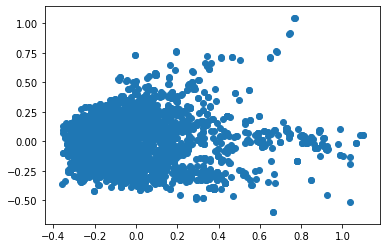

In [32]:
X = [element[0] for element in transformed_image_features]
Y = [element[1] for element in transformed_image_features]
plt.scatter(X,Y)

In [73]:
display_ids = real_sub_df['displayId'].unique()
ranks = []

for id_ in display_ids:
    size = len(real_sub_df[real_sub_df['displayId']==id_])+1
    for j in range(1,size):
        ranks.append(j)
        
real_sub_df['rank'] = ranks
real_sub_df.head(10)

,displayId,adId,ctr,rank
0,151650,6690,0.331361,1
1,151650,6257,0.205696,2
2,151650,7585,0.121164,3
3,151938,6690,0.331361,1
4,151938,123,0.186490,2
5,151938,7454,0.121164,3
6,151938,7370,0.121164,4
7,151938,7715,0.121164,5
8,151938,7379,0.121164,6
9,171024,123,0.186490,1


In [77]:
real_sub_df.drop('ctr',axis=1).to_csv('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/real_sub_df.csv',header=None,index=False)

In [128]:
sub_df[sub_df['displayId']==151650]

,displayId,adId,ctr
0,151650,7585,0.107085
1,151650,6257,0.205696
2,151650,6690,0.331361


In [118]:
ctr_ad[ctr_ad['adId']==7172].values[0][1]

0.13513513513513514

In [94]:
click_test[click_test['adId']==6515]

,displayId,adId
27,198557,6515
69,228917,6515
71,229027,6515
151,243967,6515
161,243985,6515
...,...,...
1198946,1328864,6515
1198954,1328875,6515
1198972,1328888,6515
1199031,1328928,6515


In [95]:
click_train[click_train['adId']==6515]

,displayId,adId,clicked
21,1272722,6515,0
41,1298967,6515,1
199,1326282,6515,0
246,1327810,6515,0
355,1328618,6515,0
...,...,...,...
1204034,2608760,6515,0
1204077,2608801,6515,1
1204238,2608941,6515,1
1204542,2609129,6515,0


In [36]:
# 4841292
print(click_test['adId'].unique().__len__()+click_train['adId'].unique().__len__())
print(event['adId'].unique().__len__())

3966


KeyError: 'adId'

In [17]:
mindisplayId = ad['adId'].unique()
optimizer_list = []
i = 0
for id_ in mindisplayId :
    z = pd.merge(ad[ad['adId']==id_],ad_title[ad_title['adId']==id_])
  
    size = len(z)
    for j in range(size):
        optimizer_list.append(z.iloc[j].values)
       
ad_general = pd.DataFrame(optimizer_list,columns=['adId','campaignId','advertiserId','wordId'])
ad_general.to_pickle('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/ad_general.pkl')




till this commit i merged new_df and ad_general to idk.csv. at next step i should use kernelPCA to minimize imageFeatues of each row and map then to 512 features. i should grab imageFeatures from ad_image then put them into ad_image then merge ad_image to ad and rebuild ad_general and at the end i should merge new constructed ad_general to new_df.Its better to think about ad_topic at this step but now i don't know what to do.after fixing images and topics i should give to a randomforest classifier and replace them with one column that. i means one column for images and one other column for topics.each column should cotain four values -2 to +2.




# ad_general = pd.read_csv('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/ad_general.csv')
ad_general.head(50)
del mindisplayId,optimizer_list,id_,z,size,j

In [18]:
mindisplayId = ad['adId'].unique()
optimizer_list = []
i = 0
for id_ in mindisplayId :
    z = pd.merge(ad_general[ad_general['adId']==id_],ad_image[ad_image['adId']==id_])
  
    size = len(z)
    for j in range(size):
        optimizer_list.append(z.iloc[j].values)
       
ad_general = pd.DataFrame(optimizer_list,columns=['adId','campaignId','advertiserId','wordId','imageFeatures'])
ad_general.to_csv('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/ad_general.csv')

# ad_general = pd.read_csv('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/ad_general.csv')
ad_general.head(50)
del mindisplayId,optimizer_list,id_,z,size,j

MERGING NEW_DF AND AD_GENERAL

In [153]:
minadId = new_df['adId'].unique()
optimizer_list = []
for id_ in minadId :
    z = pd.merge(new_df[new_df['adId']==id_] , ad_general[ad_general['adId']==id_])
    size = len(z)
    
    for i in range(size) :
        optimizer_list.append(z.iloc[i].values)
idk = pd.DataFrame(optimizer_list,columns=['displayId', 'timestamp', 'pageId', 'widgetId', 'device', 'OS',
       'browser', 'adId', 'clicked','campaignId', 'advertiserId', 'wordId', 'imageFeatures'])
idk.to_csv('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/ad_general.csv')


# idk = pd.read_csv('/media/sajjad/New Volume/Dataset/datadays2020_contest_public_dataset/idk.csv')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 111946 entries, 0 to 111945
Data columns (total 13 columns):
displayId        111946 non-null int64
timestamp        111946 non-null int64
pageId           111946 non-null int64
widgetId         111946 non-null int64
device           111946 non-null int64
OS               111946 non-null int64
browser          111946 non-null int64
adId             111946 non-null int64
clicked          111946 non-null int64
campaignId       111946 non-null int64
advertiserId     111946 non-null int64
wordId           111946 non-null int64
imageFeatures    111946 non-null object
dtypes: int64(12), object(1)
memory usage: 11.1+ MB


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier

In [162]:
x_train , x_test , y_train , y_test = train_test_split(idk['imageFeatures'],idk['clicked'],test_size=0.3, random_state = 101)

In [164]:
model = RandomForestClassifier(n_estimators=70,n_jobs=2,verbose=3)

In [165]:
model.fit(x_train,y_train)

ValueError: could not convert string to float: '[0.5180966258049011, 0.0, 0.0974043607711792, 0.0, 0.39861825108528137, 0.45344236493110657, 0.4143581688404083, 0.8559808135032654, 0.5064146518707275, 0.038153424859046936, 0.0052767968736588955, 0.21279069781303406, 0.00681168120354414, 0.019765423610806465, 0.09405244886875153, 0.10369634628295898, 0.0, 0.2247212827205658, 0.08206265419721603, 0.18827761709690094, 0.005097050219774246, 0.0, 0.06582766026258469, 0.2586286962032318, 0.0, 0.038786109536886215, 0.5674852132797241, 0.0, 0.5372514128684998, 1.0008103847503662, 0.0, 0.8063095808029175, 0.1000211238861084, 0.010683399625122547, 0.0461263470351696, 0.0, 0.001599978655576706, 0.018105849623680115, 0.038949646055698395, 0.0019862139597535133, 0.1701323240995407, 1.5943747758865356, 1.714460849761963, 2.2196905612945557, 1.6059435606002808, 0.11029370874166489, 0.155554860830307, 0.243074432015419, 0.3838268518447876, 0.0, 0.015512408688664436, 0.1123475432395935, 0.0, 0.13392311334609985, 0.8627898097038269, 0.743706226348877, 0.0, 0.0, 0.0, 0.31727445125579834, 0.1112203598022461, 0.0, 0.0, 0.0, 0.026773281395435333, 0.3335382044315338, 0.009162763133645058, 0.0, 0.0, 1.3171809911727905, 0.0011482542613521218, 0.27689212560653687, 0.08953747898340225, 0.014187115244567394, 0.22023464739322662, 0.05854053795337677, 0.13360677659511566, 0.01512223668396473, 0.2770589590072632, 0.3420541286468506, 0.944238007068634, 0.17377300560474396, 0.03385951370000839, 0.0, 0.0024769422598183155, 0.45961496233940125, 0.03338589891791344, 0.26359492540359497, 0.010947942733764648, 0.0, 0.9861981868743896, 0.0, 0.018994728103280067, 0.12781652808189392, 0.162319153547287, 0.0, 0.0, 0.9723755717277527, 0.0371055006980896, 0.24155834317207336, 0.5493254065513611, 0.02228330634534359, 0.29788514971733093, 0.6192152500152588, 0.0, 0.6793885231018066, 1.453635334968567, 1.3771110773086548, 0.5118381381034851, 0.29730314016342163, 0.3969261348247528, 0.0, 0.0, 0.0, 0.7929512858390808, 0.12563267350196838, 0.9242403507232666, 0.7898348569869995, 0.1419675499200821, 0.0, 0.25058260560035706, 0.0, 0.10517282783985138, 0.28358522057533264, 0.00022116424224805087, 0.008489721454679966, 0.18448202311992645, 0.4993380606174469, 0.052402280271053314, 0.0, 0.10978073626756668, 0.18735739588737488, 0.19712555408477783, 0.137292742729187, 0.8384523987770081, 0.17903728783130646, 0.48398974537849426, 0.0, 0.6719465851783752, 0.30107635259628296, 0.6238163709640503, 0.0, 0.026359179988503456, 0.0, 0.2194291353225708, 0.1097431480884552, 0.1418841928243637, 0.006919437553733587, 0.25132882595062256, 3.4650628566741943, 2.1904752254486084, 0.9301636219024658, 2.440887928009033, 0.0, 0.04634353145956993, 0.05042142793536186, 0.0, 0.24153514206409454, 0.1403900682926178, 0.27899718284606934, 1.2674667835235596, 0.0, 0.03620792180299759, 0.20085562765598297, 0.14387397468090057, 0.034336015582084656, 0.06683219969272614, 0.0441368967294693, 0.08002644777297974, 0.6603301763534546, 0.7423901557922363, 0.03818260878324509, 0.8591451644897461, 0.1098317876458168, 0.28060129284858704, 0.0, 0.0, 1.5259243249893188, 0.4908590018749237, 0.6166254878044128, 0.02181367203593254, 0.31823083758354187, 0.010708861984312534, 2.7366347312927246, 0.15042664110660553, 0.3505651354789734, 0.14162752032279968, 0.0, 0.010748809203505516, 0.22433388233184814, 0.05006858706474304, 1.0580848455429077, 0.2230503112077713, 0.272471159696579, 0.2486698180437088, 0.15421172976493835, 0.9184884428977966, 0.4756092131137848, 0.05794931948184967, 0.25296637415885925, 0.047546930611133575, 0.0, 0.21342861652374268, 0.3331468105316162, 0.1587962955236435, 0.0, 0.09358860552310944, 0.16462789475917816, 0.0032287403009831905, 0.4392916262149811, 2.99183988571167, 0.08949632942676544, 0.47632497549057007, 0.13672955334186554, 0.003996105864644051, 0.0, 0.0, 0.0, 0.08111266791820526, 0.0, 0.04284205660223961, 0.04521120339632034, 0.0, 0.013472010381519794, 0.27834221720695496, 1.8236284255981445, 0.846917986869812, 0.46239590644836426, 0.0, 0.028454022482037544, 0.1664966642856598, 0.390461802482605, 0.7827945351600647, 0.3971693813800812, 0.18524692952632904, 0.14416582882404327, 0.04429076239466667, 0.26344236731529236, 0.0, 0.8397928476333618, 0.22022013366222382, 0.0, 0.0, 0.08423073589801788, 0.08956925570964813, 0.06451471149921417, 0.0926181897521019, 0.1302507370710373, 0.6120527982711792, 0.8927813768386841, 0.012403028085827827, 0.10216440260410309, 0.549020528793335, 0.9113079309463501, 0.0257249902933836, 0.0, 0.9382982850074768, 0.0, 0.0, 0.0, 0.0, 0.0, 0.23626896739006042, 0.0, 0.014527162536978722, 0.008843786083161831, 0.5112544894218445, 0.43021509051322937, 0.0, 0.06740329414606094, 0.538979172706604, 1.2454123497009277, 0.10317883640527725, 0.017584174871444702, 0.3277320861816406, 0.0023326559457927942, 0.778267502784729, 0.0, 0.09439091384410858, 0.0, 0.7545698881149292, 0.0, 0.0, 0.09165987372398376, 0.11540769040584564, 0.37427282333374023, 1.41033136844635, 0.09395292401313782, 0.6427426338195801, 0.9120809435844421, 0.24026095867156982, 0.05088932067155838, 0.0, 0.8652318120002747, 0.0, 0.029243703931570053, 0.20949555933475494, 0.2122410088777542, 1.0246878862380981, 0.12962044775485992, 0.6854716539382935, 0.062333058565855026, 0.796084463596344, 1.316979169845581, 0.05150813236832619, 0.19796334207057953, 0.03826871141791344, 0.09221343696117401, 0.0, 0.3549746870994568, 0.0026850940193980932, 0.252926766872406, 0.4740039110183716, 0.20550388097763062, 0.7322118282318115, 0.6535729765892029, 0.10199087113142014, 0.20178741216659546, 0.0022827049251645803, 0.21890559792518616, 0.5250682234764099, 2.798706531524658, 1.1881399154663086, 0.19020138680934906, 0.03404514491558075, 0.16870565712451935, 0.0717030018568039, 0.37126243114471436, 0.05685471370816231, 0.0958438590168953, 0.0, 0.049378443509340286, 0.0029744571074843407, 0.1308167427778244, 0.7839678525924683, 0.516395628452301, 0.5398823618888855, 0.6086366772651672, 0.0005374052561819553, 0.419732928276062, 0.0, 0.7528741359710693, 0.0, 0.018050003796815872, 0.47016188502311707, 0.5564638376235962, 0.0, 0.0902024358510971, 0.06880154460668564, 0.4010375440120697, 0.05186000466346741, 0.0, 0.0, 0.09005984663963318, 0.7731883525848389, 0.375122606754303, 0.19812634587287903, 0.2971647083759308, 0.2133007049560547, 0.7376108765602112, 0.195261150598526, 0.16348324716091156, 0.1417761743068695, 1.3462578058242798, 0.0, 0.32943737506866455, 0.08031211048364639, 0.0, 0.0026882642414420843, 0.6419309973716736, 0.002694052644073963, 0.20995715260505676, 0.03823351487517357, 0.5551983714103699, 0.0019602905958890915, 0.21337680518627167, 0.018316786736249924, 0.02807675488293171, 0.1352497637271881, 0.807662844657898, 0.2964925467967987, 0.0035808079410344362, 0.0, 0.41727256774902344, 0.8018708229064941, 0.3855893611907959, 0.7562233805656433, 0.5003595352172852, 0.30417636036872864, 0.03232816606760025, 0.5056059956550598, 0.011334383860230446, 0.012384288012981415, 0.2928297817707062, 0.0, 0.03802564740180969, 1.0294448137283325, 0.014998177997767925, 0.6676614880561829, 0.8029599785804749, 0.16131985187530518, 0.0895400196313858, 0.08077726513147354, 0.18256361782550812, 0.06962043046951294, 0.03743128851056099, 0.030021782964468002, 0.4418545961380005, 0.5875715613365173, 0.0, 2.2330322265625, 0.25775808095932007, 0.0, 0.03844635933637619, 0.643951952457428, 0.15626829862594604, 0.0, 0.7595891952514648, 0.66712886095047, 0.0, 0.2970578372478485, 0.0, 0.7677679061889648, 0.03662409633398056, 0.27521055936813354, 0.0, 0.9490814208984375, 0.971508264541626, 0.9857769012451172, 0.34691059589385986, 0.005322939250618219, 0.25894030928611755, 0.01333925686776638, 0.040598850697278976, 0.1618604063987732, 0.03861217945814133, 0.7696407437324524, 0.5111542344093323, 0.44997042417526245, 0.31276169419288635, 0.22812055051326752, 0.19639036059379578, 1.0675554275512695, 0.0, 0.5976868867874146, 0.03132857382297516, 0.7972787022590637, 0.5334246158599854, 0.005999147891998291, 1.3015903234481812, 0.22282756865024567, 0.3669635057449341, 0.008552095852792263, 0.7078807950019836, 0.5285637974739075, 0.0, 0.023788293823599815, 0.1291700303554535, 1.676281213760376, 0.00950455293059349, 0.13050411641597748, 0.40622103214263916, 0.6229011416435242, 0.046361200511455536, 0.19792801141738892, 0.8151938319206238, 0.11948475241661072, 0.5910972356796265, 0.0545172244310379, 0.08281844854354858, 0.289998322725296, 0.781715989112854, 0.0, 0.0, 0.10121972113847733, 0.03416692093014717, 0.46853193640708923, 0.1422671526670456, 0.040976714342832565, 0.2943503260612488, 4.603487014770508, 0.041390981525182724, 0.10581802576780319, 0.0, 0.37123292684555054, 0.10051329433917999, 0.719227135181427, 0.0, 0.22986653447151184, 0.0, 0.4639042615890503, 0.2293941080570221, 0.10161428898572922, 0.10337097942829132, 0.16797927021980286, 0.14565329253673553, 0.5325958132743835, 0.27261725068092346, 0.3126446306705475, 0.06119595468044281, 0.0, 0.0, 0.2943357527256012, 0.13183540105819702, 0.06298714876174927, 1.0073208808898926, 2.302391529083252, 0.778148353099823, 0.6410564184188843, 0.0, 0.46225520968437195, 0.14422385394573212]'

In [157]:
ad_general.columns

Index(['adId', 'campaignId', 'advertiserId', 'wordId', 'imageFeatures'], dtype='object')

In [151]:
ad_general.columns.values[:]

array(['adId', 'campaignId', 'advertiserId', 'wordId', 'imageFeatures'],
      dtype=object)

MERGING PAGE ENTITIES 

In [19]:
mindisplayId = page['pageId'].unique()[:10]
optimizer_list = []
i = 0
for id_ in mindisplayId :
    z = pd.merge(page[page['pageId']==id_],page_topic[page_topic['pageId']==id_])
  
    size = len(z)
    for j in range(size):
        optimizer_list.append(z.iloc[j].values)
       
page_general = pd.DataFrame(optimizer_list,columns=['pageId','website','publisher','topicId','confidence'])
# pd.merge(ad[ad['adId']==7867],ad_title[ad_title['adId']==7867])
del mindisplayId,optimizer_list,id_,z,size,j

In [42]:
# page_topic[page_topic['confidence']>0.85]
print(len(page_topic['pageId'].unique()) )
print(len(page['pageId'].unique()))

7025818
10779259


In [44]:
page_topic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28118756 entries, 0 to 28118755
Data columns (total 3 columns):
pageId        int64
topicId       int64
confidence    float64
dtypes: float64(1), int64(2)
memory usage: 643.6 MB


In [45]:
page.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10779259 entries, 0 to 10779258
Data columns (total 3 columns):
pageId       int64
website      int64
publisher    int64
dtypes: int64(3)
memory usage: 246.7 MB


In [93]:
# plt.scatter(x='confidence',y='topicId',data=page_topic[page_topic['confidence']>0.7])
# # sns.barplot()
refrenced_df = page_topic[page_topic['confidence']>0.8]
pageIds = refrenced_df['pageId'].unique()
optimizer_list = {'pageId' : [] ,
                  'confidence':[]}
for id_ in pageIds :
    grabed_df = refrenced_df[refrenced_df['pageId']==id_] 
    topics = grabed_df['topicId']
    confidences = grabed_df['confidence']
    l = [0*i for i in range(50)]
    size = len(confidences)
    for j in range(size) :
        l[topics.values[j]] = confidences.values[j]
    
    optimizer_list['pageId'].append(id_)
    optimizer_list['confidence'].append(l)


new_page_topic = pd.DataFrame.from_dict(optimizer_list)
new_page_topic.head()

,pageId,confidence
0,10743234,"[0, 0, 0, 0, 0, 0, 0, 0.87764394, 0, 0, 0, 0, ..."
1,10743233,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
2,10743227,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
3,10743219,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."
4,10743206,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ..."


In [97]:
new_page_topic.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1213123 entries, 0 to 1213122
Data columns (total 2 columns):
pageId        1213123 non-null int64
confidence    1213123 non-null object
dtypes: int64(1), object(1)
memory usage: 18.5+ MB


In [15]:
 page_topic[page_topic['confidence']>0.8]

,pageId,topicId,confidence
46,10743234,7,0.877644
47,10743233,37,0.942834
65,10743227,37,0.863412
82,10743219,39,0.968905
112,10743206,35,0.845380
...,...,...,...
28118684,27,45,0.809087
28118700,23,8,0.882282
28118702,21,45,0.920379
28118729,14,40,0.844393
